[Aula Prática](https://youtu.be/cIWDLbB_Kf4)

<center>Universidade Federal de Viçosa</center>
<center>Coordenadoria de Educação Aberta e a Distância</center>
<center>Inteligência Artificial e Computacional</center>
<center>ELT578 - Análise de Imagens e Visão Computacional</center>

**<center>AULA PRÁTICA 2: Técnicas de Realce</center>**

O objetivo é compreender como manipular imagens digitais para destacar detalhes importantes, seja realçando partes claras, escuras ou ajustando o contraste.



### 1 Montando o Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###2 Importando bibliotecas

---



In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

### 3 Leitura e exibição da imagem

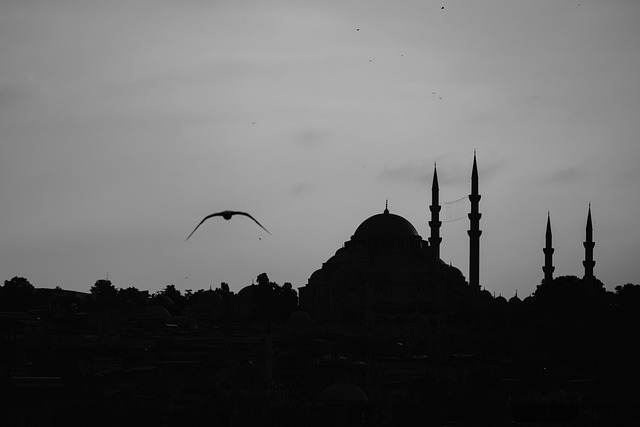

In [ ]:
Im = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/istanbul.jpg', 0)
cv2_imshow(np.uint8(Im))


No código acima, fiquei com dúvida em relação a utilização do código. Pedi uma explicação do Gemini, que me respondeu da seguinte maneira:


Quais os benefícios de se usar o código `cv2_imshow(np.uint8(Im))`?

O uso de cv2_imshow(np.uint8(Im)) é importante por dois motivos principais:

Compatibilidade com o Colab: O OpenCV padrão usa cv2.imshow(), que abre uma janela externa. Isso não funciona em ambientes de nuvem como o Colab. A função cv2_imshow (do patch google.colab.patches) renderiza a imagem diretamente dentro do notebook.

Consistência de Dados (np.uint8): Imagens digitais de 8 bits esperam valores inteiros entre 0 e 255. Se sua variável Im for do tipo float (comum após operações matemáticas como o Logaritmo no item 5), o OpenCV pode interpretar os dados de forma errada ou exibir uma imagem preta. Converter explicitamente para uint8 garante que os valores estejam no formato correto para exibição visual.


### 4 Negativo da imagem




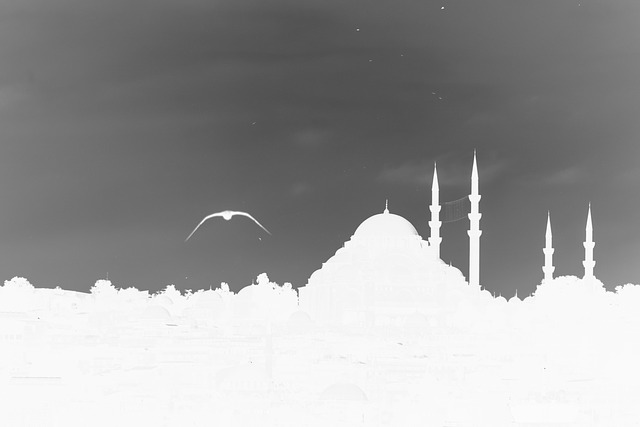

In [ ]:
#Inverte os tons: pixels claros ficam escuros e vice-versa.
neg = cv2.subtract(255, Im)
cv2_imshow(neg)

### 5 Transformação Logarítmica

uint8
float16
5.285
0.0
255
0


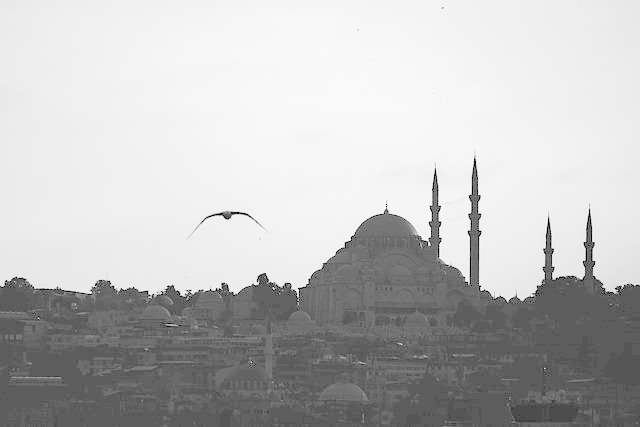

In [ ]:
#Realça detalhes em áreas escuras
Ie = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/istanbul.jpg', 0)
Is = np.log(cv2.add(Ie, 1))

print (Ie.dtype)
print (Is.dtype)

print (Is.max())
print (Is.min())

Is = (Is - Is.min()) / (Is.max() - Is.min()) * 255
Is = np.uint8(Is)

print (Is.max())
print (Is.min())

cv2_imshow(Is)


### 6 Transformação Exponencial

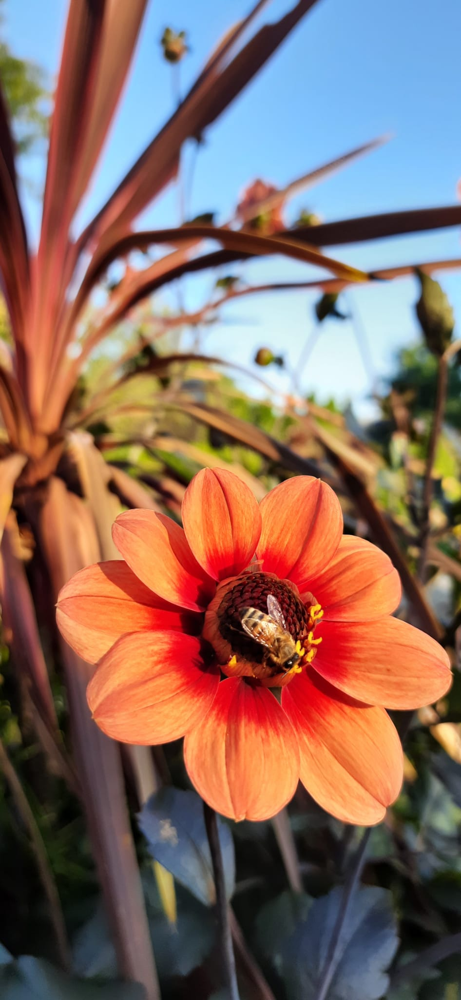

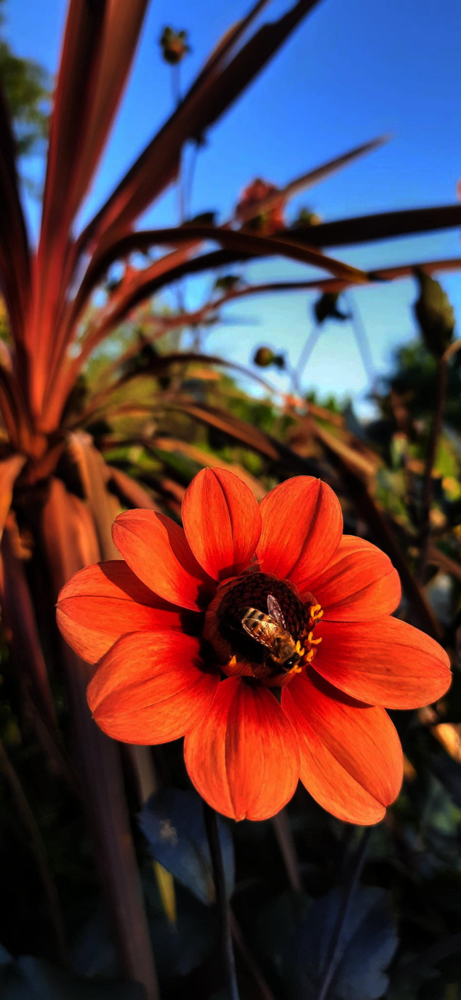

In [ ]:
#Realça detalhes em áreas claras.

Ie = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_1/flower.jpeg',1)
cv2_imshow(Ie)

b = 1.01 #A base b > 1 controla a intensidade do realce.
Is = np.power(b, Ie) - 1
Is = Is * 255 / Is.max()
Is = np.uint8(Is)
cv2_imshow(Is)

#### 6.1 Transformação Exponencial Interativa com Slider

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def apply_exponential_transformation(b_value):
    # Garante que a imagem seja carregada dentro da função para cada atualização do slider
    # Ou você pode carregar Ie uma vez fora e passá-la como argumento para a função,
    # mas para simplicidade, vamos recarregar aqui.
    Ie_slider = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_1/flower.jpeg', 1)

    if Ie_slider is None:
        print("Erro: Não foi possível carregar a imagem. Verifique o caminho.")
        return

    # Realça detalhes em áreas claras.
    Is_slider = np.power(b_value, Ie_slider) - 1
    Is_slider = (Is_slider / Is_slider.max()) * 255 # Normaliza para 0-255
    Is_slider = np.uint8(Is_slider)

    with output:
        clear_output(wait=True)
        print(f"Valor de b: {b_value:.2f}")
        cv2_imshow(Is_slider)

# Cria o slider para o valor de b
# O valor de b deve ser > 1, então definimos um range adequado.
# Por exemplo, de 1.01 a 2.0, com um passo pequeno para ajustes finos.
b_slider = widgets.FloatSlider(
    value=1.01,
    min=1.01,
    max=2.0,
    step=0.01,
    description='Valor de b:',
    continuous_update=True,
    orientation='horizontal',
    readout=True,
    readout_format='.2f',
)

output = widgets.Output()

display(b_slider, output)

# Conecta o slider à função de transformação
b_slider.observe(lambda change: apply_exponential_transformation(change.new), names='value')

# Chama a função uma vez com o valor inicial para exibir a imagem no início
apply_exponential_transformation(b_slider.value)

FloatSlider(value=1.01, description='Valor de b:', max=2.0, min=1.01, step=0.01)

Output()

### 7 Limiarização (Thresholding)

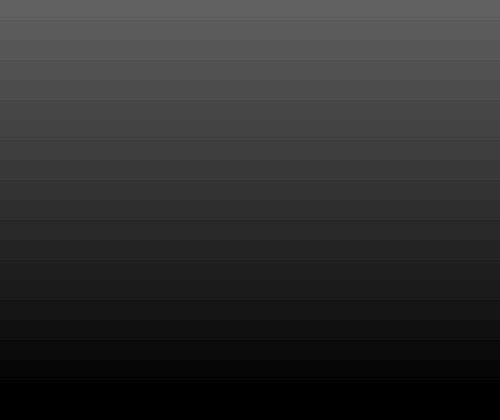

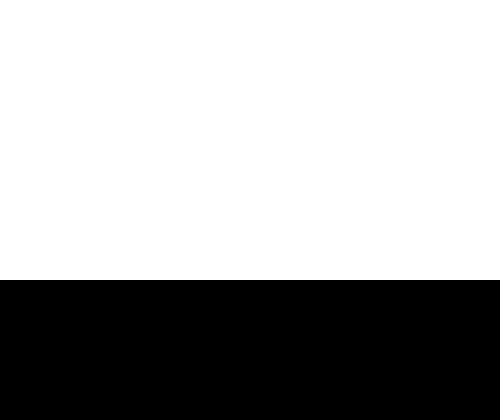

In [ ]:
#Técnica simples de segmentação de imagens.
Im = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/PC.jpg', 0)
cv2_imshow(Im)

k = 30

Im_thr = Im.copy()
Im_thr[Im > k] = 255
Im_thr[Im <= k] = 0
cv2_imshow(Im_thr)

###8 Equalização de Histograma (Global)

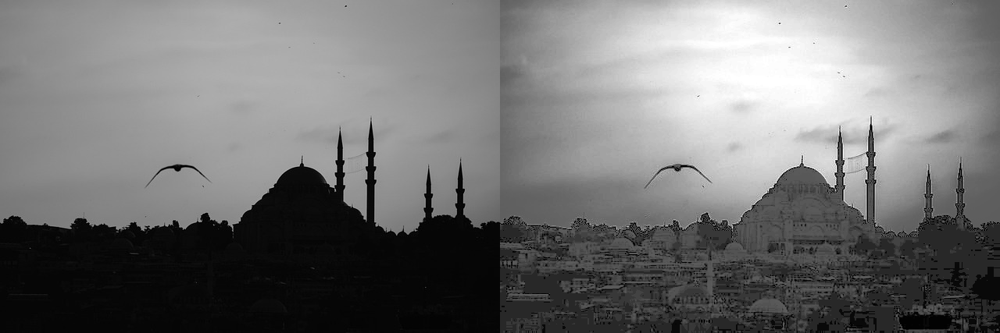

/tmp/ipython-input-2738012723.py:8: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(Im.ravel(), 255, [0,256])


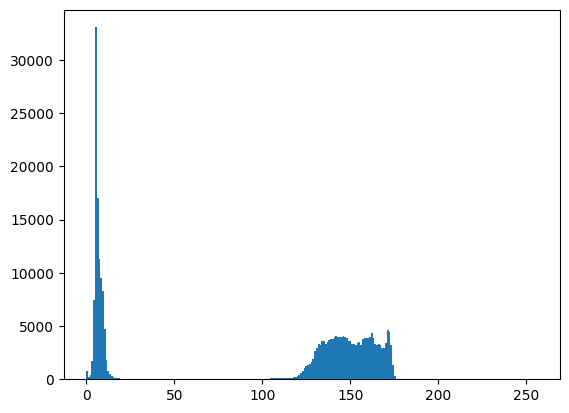

/tmp/ipython-input-2738012723.py:10: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(Im_eq.ravel(), 255, [0,256])


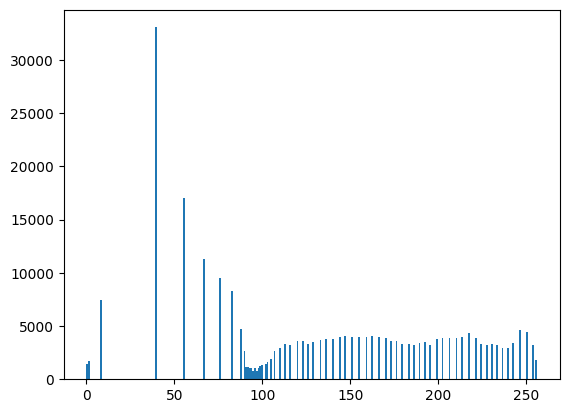

In [ ]:
from matplotlib import pyplot as plt
Im = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/istanbul.jpg', 0)
Im_eq = cv2.equalizeHist(Im)

resul = np.hstack((Im, Im_eq))
cv2_imshow(resul)

plt.hist(Im.ravel(), 255, [0,256])
plt.show()
plt.hist(Im_eq.ravel(), 255, [0,256])
plt.show()

###9 CLAHE (Equalização Adaptativa)

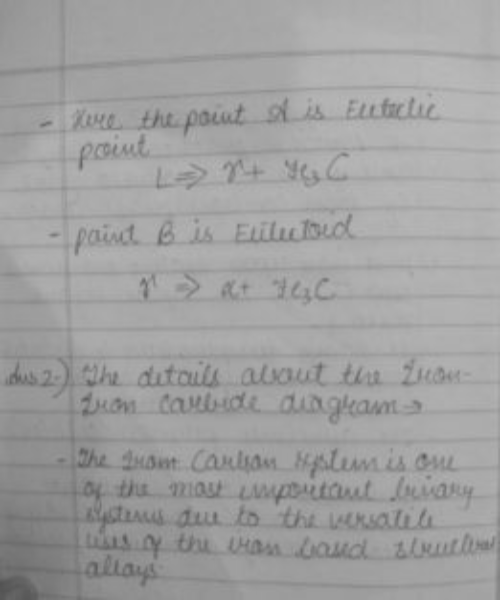

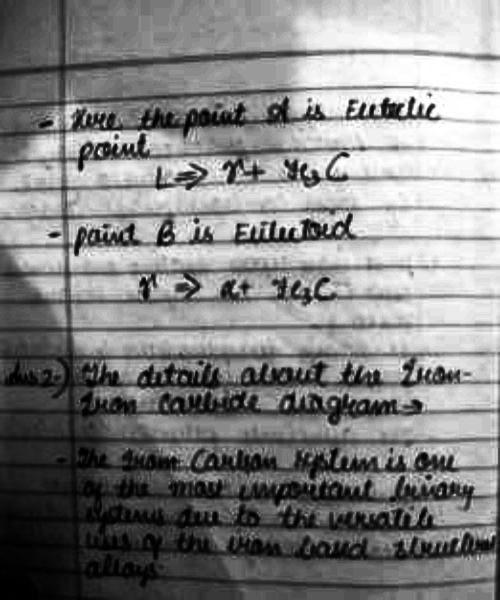

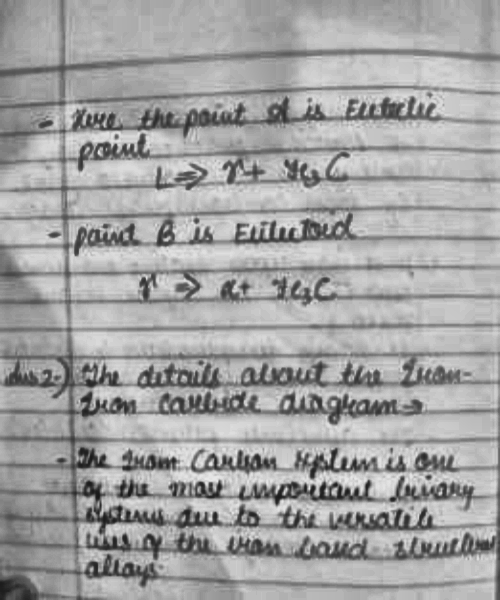

In [ ]:
image = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/image.jpg')
image = cv2.resize(image, (500, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

image_gray_eg = cv2.equalizeHist(image_gray)
cv2_imshow(image_gray_eg)

clahe = cv2.createCLAHE(clipLimit=5) #CLAHE (Contrast Limited Adaptive Histogram Equalization) #default= 40 #tileGridSize=(8,8)
final_img = clahe.apply(image_gray)
cv2_imshow(final_img)


**DESAFIO**

* Equalização em imagens coloridas (RGB)

### 10 Outras Operações Comuns

Vamos explorar redimensionamento, rotação, filtros de suavização e detecção de bordas.

Imagem Redimensionada:


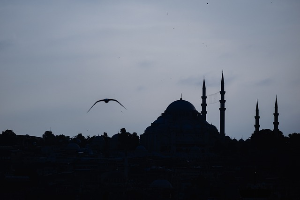

Imagem Rotacionada (45 graus):


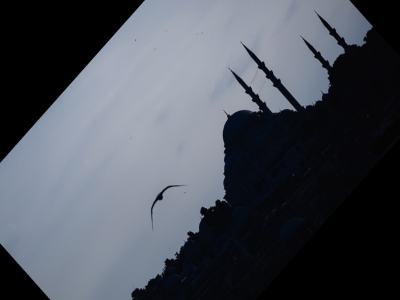

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Carregando a imagem original
img = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/istanbul.jpg')

# 1. Redimensionamento (Resize)
# Definindo novas dimensões (largura, altura)
img_resized = cv2.resize(img, (300, 200))
print("Imagem Redimensionada:")
cv2_imshow(img_resized)

# 2. Rotação (Rotation)
(h, w) = img.shape[:2]
centro = (w // 2, h // 2)
# Matriz de rotação: centro, ângulo (45 graus), escala (1.0)
M = cv2.getRotationMatrix2D(centro, 45, 1.0)
img_rotated = cv2.warpAffine(img, M, (w, h))
print("Imagem Rotacionada (45 graus):")
cv2_imshow(cv2.resize(img_rotated, (400, 300)))

Imagem com Blur Gaussiano:


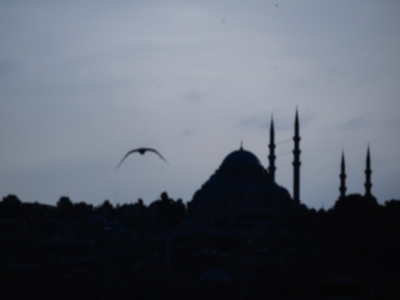

Detecção de Bordas (Canny):


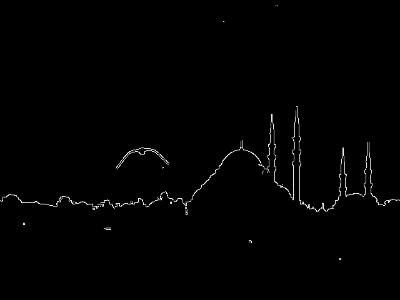

In [ ]:
# 3. Suavização (Blur/Filtro Gaussiano)
# Útil para remover ruído antes de outras detecções
img_blur = cv2.GaussianBlur(img, (7, 7), 0)
print("Imagem com Blur Gaussiano:")
cv2_imshow(cv2.resize(img_blur, (400, 300)))

# 4. Detecção de Bordas (Canny Edge Detection)
# Converte para cinza primeiro para melhor resultado
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 200)
print("Detecção de Bordas (Canny):")
cv2_imshow(cv2.resize(edges, (400, 300)))

O código acima foi gerado pelo Gemini, em que foi suferido mais opções para tratamento de imagens:

Mostre outras operações de manipulação de imagem com OpenCV

Com certeza! Além das técnicas de realce que você já viu, o OpenCV oferece diversas outras operações fundamentais. Vou adicionar exemplos de Redimensionamento, Rotação, Suavização (Blur) e Detecção de Bordas (Canny).